# Whole city count prediction 

In [9]:
from utils.plots import plot, displot
from seaborn import distplot
import matplotlib.pyplot as plt
from models.baseline_models import historic_average

import os
import logging as log
from time import strftime
from copy import deepcopy
from torch import nn, optim
import torch.nn.functional as F
from utils.data_processing import *
from logger.logger import setup_logging
from utils.configs import BaseConf
from utils.utils import write_json, Timer
from models.kangkang_fnn_models import KangFeedForwardNetwork, SimpleKangFNN, evaluate_fnn
from dataloaders.flat_loader import FlatDataLoaders, MockLoader, MockLoaders
from datasets.flat_dataset import FlatDataGroup
from utils.metrics import PRCurvePlotter, ROCCurvePlotter, LossPlotter, PerTimeStepPlotter
from sklearn.metrics import accuracy_score, average_precision_score, roc_auc_score
from models.model_result import ModelResult, ModelMetrics, save_results, save_metrics, \
    compare_all_models, get_models_metrics
from utils.mock_data import mock_fnn_data_classification
from utils.plots import im
from utils.utils import pshape, get_data_sub_paths, by_ref
from trainers.generic_trainer import train_model
from models.kangkang_fnn_models import train_epoch_for_fnn

from utils.metrics import best_threshold, get_y_pred, get_y_pred_by_thresholds, best_thresholds
from time import time
from torch.optim import lr_scheduler

from pprint import pprint
import logging
from utils.plots import plot_time_signals

from matplotlib import rcParams
from utils.forecasting import compare_time_series_metrics

In [10]:
os.environ['NUMEXPR_MAX_THREADS'] = str(os.cpu_count())
rcParams["font.family"] = "STIXGeneral"
# rcParams['figure.dpi'] = 100
# rcParams['savefig.dpi'] = 100

In [29]:
from utils.utils import load_total_counts
from utils.data_processing import normalize_df
from utils.plots import plot

data_sub_paths = [i for i in get_data_sub_paths() if i.startswith('Tota')]
sorted(data_sub_paths)

['Totals_T168H_2001-01-04_2019-01-03_LAT41.645_42.022_LON-87.934_-87.525',
 'Totals_T1H_2014-01-01_2019-01-01_LAT41.645_42.022_LON-87.934_-87.525',
 'Totals_T24H_2001-01-01_2019-01-01_LAT41.645_42.022_LON-87.934_-87.525']

In [41]:
data_sub_path = data_sub_paths[2]
FREQ = data_sub_path.lstrip('Totals_T').split('_')[0]
time_steps_per_day = 24/int(FREQ[:-1])

freq_title = {
    "24H":"Daily",
    "1H": "Hourly",
    "168H":"Weekly",
}.get(FREQ, "Hourly")
print(f"Using: {freq_title} ({FREQ})")

Using: Daily (24H)


In [42]:
df = load_total_counts(folder_name=data_sub_paths[0])
df['TOTAL'] = df.sum(axis=1)
df = normalize_df(df)
df

,THEFT,BATTERY,CRIMINAL DAMAGE,NARCOTICS,ASSAULT,BURGLARY,MOTOR VEHICLE THEFT,ROBBERY,TOTAL
2001-01-04,0.277884,0.230954,0.290780,0.354839,0.146341,0.255319,0.378049,0.334184,0.357172
2001-01-11,0.666826,0.592717,0.543735,0.588558,0.548063,0.613475,0.550305,0.566327,0.757604
2001-01-18,0.706387,0.573551,0.557132,0.624467,0.375897,0.629433,0.629573,0.714286,0.773557
2001-01-25,0.602479,0.519406,0.490150,0.620207,0.454806,0.643617,0.666159,0.602041,0.722185
2001-02-01,0.639657,0.557259,0.484634,0.614729,0.532281,0.670213,0.623476,0.599490,0.746654
...,...,...,...,...,...,...,...,...,...
2018-11-29,0.368923,0.250120,0.174153,0.111382,0.347202,0.221631,0.280488,0.270408,0.318643
2018-12-06,0.429457,0.275515,0.234043,0.107121,0.295552,0.253546,0.271341,0.252551,0.348114
2018-12-13,0.448999,0.268328,0.221434,0.094948,0.340029,0.230496,0.207317,0.288265,0.345410
2018-12-20,0.483794,0.266411,0.260835,0.066342,0.279770,0.237589,0.228659,0.323980,0.353792


In [43]:
print(torch.cuda.memory_summary())
torch.cuda.is_available()

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |       0 B  |       0 B  |       0 B  |       0 B  |
|       from large pool |       0 B  |       0 B  |       0 B  |       0 B  |
|       from small pool |       0 B  |       0 B  |       0 B  |       0 B  |
|---------------------------------------------------------------------------|
| Active memory         |       0 B  |       0 B  |       0 B  |       0 B  |
|       from large pool |       0 B  |       0 B  |       0 B  |

True

In [44]:
# manually set
conf = BaseConf()
conf.seed = int(time()) # 3
conf.model_name = f"{freq_title} City Count" # "SimpleKangFNN" # "KangFNN"  # needs to be created
conf.data_path = f"./data/processed/{data_sub_path}/"

if not os.path.exists(conf.data_path):
    raise Exception(f"Directory ({conf.data_path}) needs to exist.")

conf.model_path = f"{conf.data_path}models/{conf.model_name}/"
os.makedirs(conf.data_path, exist_ok=True)
os.makedirs(conf.model_path, exist_ok=True)

# logging config is set globally thus we only need to call this in this file
# imported function logs will follow the configuration
setup_logging(save_dir=conf.model_path, log_config='./logger/standard_logger_config.json', default_level=log.INFO)
log.info("=====================================BEGIN=====================================")

info = deepcopy(conf.__dict__)
info["start_time"] = strftime("%Y-%m-%dT%H:%M:%S")

# DATA LOADER SETUP
np.random.seed(conf.seed)
use_cuda = torch.cuda.is_available()
if use_cuda:
    torch.cuda.manual_seed(conf.seed)
else:
    torch.manual_seed(conf.seed)

device = torch.device("cuda:0" if use_cuda else "cpu")
log.info(f"Device: {device}")
info["device"] = device.type
conf.device = device

# SET THE HYPER PARAMETERS
conf.shaper_top_k = -1
conf.use_classification = False
conf.train_set_first = True
conf.use_crime_types = True

# data_group = FlatDataGroup(data_path=conf.data_path, conf=conf)
# data_group.crimes.shape
# loaders = FlatDataLoaders(data_group=data_group, conf=conf)

2020-11-27T22:38:46 | root | INFO | =====================================BEGIN=====================================
2020-11-27T22:38:46 | root | INFO | Device: cuda:0


In [45]:
# totals = data_group.to_counts(data_group.crimes[:,0:1])[:,0].sum(1) # data_group.crimes[:,0].sum(1)
# totals = totals - np.min(totals)
# totals = totals/np.max(totals)

# total_targets = data_group.to_counts(data_group.targets[:,0:1])[:,0].sum(1) # data_group.crimes[:,0].sum(1)
# total_targets = total_targets - np.min(total_targets)
# total_targets = total_targets/np.max(total_targets)


# displot(totals=totals, total_targets=total_targets,  total_crimes=data_group.total_crimes[:,0])
# plot_time_signals(
#     t_range=data_group.t_range,
#     totals=totals, total_crimes=data_group.total_crimes[:,0],
#     total_targets=total_targets,
# )

# # totals = data_group.total_crimes[:,0]
# # plot(totals=totals)

# Determine the total crime counts in the next time step

In [46]:
# rnn models that we have
from models.rnn_models import MultiLayerGRU,  \
    GRUFNN, RecurrentFeedForwardNetwork, SimpleRecurrentFeedForwardNetwork

from utils.forecasting import forecast_metrics

import numpy as np
import torch
from utils.plots import plot
import torch.nn as nn
from utils.data_processing import batchify, sequencify
from datasets.sequence_dataset import SequenceDataset, SequenceDataLoaders
from models.sequence_models import train_epoch_for_sequence_model, evaluate_sequence_model
from utils.data_processing import safe_divide
from utils.utils import get_data_sub_paths

In [47]:
from utils.utils import load_total_counts
from utils.data_processing import normalize_df
from utils.plots import plot

folder_names = [i for i in get_data_sub_paths() if i.startswith('Tota')]
print(folder_names)

df = load_total_counts(folder_names[0])
df['TOTAL'] = df.sum(axis=1)
# df = normalize_df(df)

['Totals_T168H_2001-01-04_2019-01-03_LAT41.645_42.022_LON-87.934_-87.525', 'Totals_T1H_2014-01-01_2019-01-01_LAT41.645_42.022_LON-87.934_-87.525', 'Totals_T24H_2001-01-01_2019-01-01_LAT41.645_42.022_LON-87.934_-87.525']


In [51]:
# with np.load(conf.data_path + "generated_data.npz") as zip_file:  # context helper ensures zip_file is closed
#     if conf.use_crime_types:
#         log.info(f"loading crimes grids WITH crime types")
#         crimes = zip_file["crime_types_grids"]
#     else:
#         log.info(f"loading crimes grids WITHOUT crime types")
#         crimes = zip_file["crime_grids"]  # original crime counts

#     weather_vectors = zip_file["weather_vectors"][1:]  # get weather for target date
#     crime_feature_indices = list(zip_file["crime_feature_indices"])
    
total_t_range = df.index
t_range= total_t_range[1:] # should be t_range of target date

feature_names = df.columns
unscaled_total_crime_types = df#crimes[:,:-1].sum(2).sum(2)
print(feature_names, len(feature_names), unscaled_total_crime_types.shape)

assert len(total_t_range) == len(unscaled_total_crime_types)

assert len(feature_names) == unscaled_total_crime_types.shape[1], \
    f"feature_names:{len(feature_names)} != total_crime_types:{unscaled_total_crime_types.shape[1]}"

Index(['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS', 'ASSAULT',
       'BURGLARY', 'MOTOR VEHICLE THEFT', 'ROBBERY', 'TOTAL'],
      dtype='object') 9 (939, 9)


In [65]:
import plotly.graph_objects as go
go.Figure(
    data=[
        go.Scatter(
            y=unscaled_total_crime_types[feature_names].values,
            x=t_range, # np.arange(len(total_crime_types[:,i])), 
            name=name.title(),
            opacity=0.3,
        ) 
        for i, name in enumerate(feature_names)
    ],
    layout=dict(
        title=f"{freq_title} City Wide Crime Counts",
        xaxis_title="Date",
        yaxis_title="Counts",
        title_x=0.5,
        font=dict(family="STIXGeneral"),
    ),
).show()

In [67]:
total_df = df

In [13]:
# # Normalize vectors
# from utils.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# total_crime_types = scaler.fit_transform(unscaled_total_crime_types, axis=1)

# total_df = pd.DataFrame({k.title(): total_crime_types[:,i] for i,k in enumerate(feature_names)})

In [14]:
# def get_period(series):
#     """
#     series: pandas series
#     """
#     max_lag = int(.1*len(series))
#     args = np.argsort([series.autocorr(i) for i in range(1,max_lag)])[::-1][:10] + 1
#     print(args)
#     return int(np.diff(args).mean())
    
# def autocorr(series):
#     max_lag = int(.1*len(series))
#     return np.array([series.autocorr(i) for i in range(1,max_lag)])
     
    
# arr = total_df.Total
# print(get_period(arr))

# plot(title='Total Crime',total=arr).show()

# auto_corr = autocorr(arr)
# auto_corr2 = autocorr(pd.Series(auto_corr))

# plot(title='Total Crime Auto-Correlation',auto_corr=auto_corr).show()
# plot(title='Total Crime Auto-Correlation Auto-Correlation',auto_corr2=auto_corr2).show()

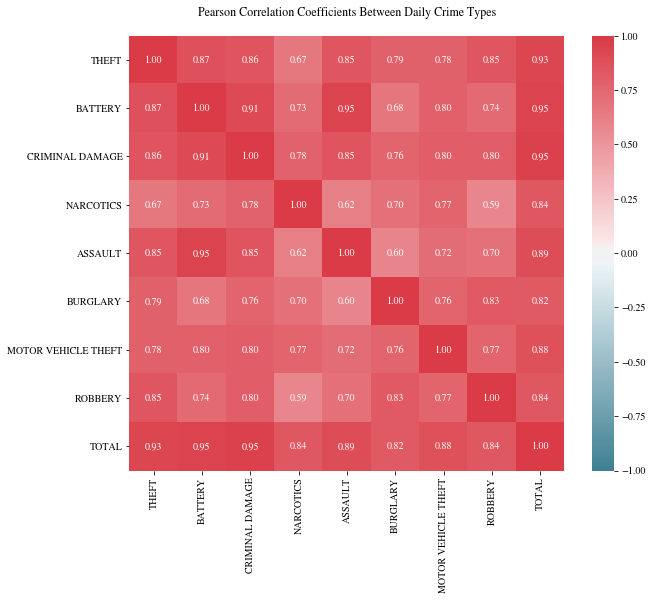

In [68]:
from utils.plots import plot_corr
corr = total_df.loc[:, total_df.columns != 'Total'].corr()
plot_corr(corr, title=f'Pearson Correlation Coefficients Between {freq_title} Crime Types\n')

In [70]:
time_vectors = encode_time_vectors(t_range, month_divisions=11, year_divisions=24, kind='sincos')  # kind='ohe')

k = int(time_steps_per_day*365)
tv, tr = time_vectors[:k], t_range[:k]

t_vec_names = {
    "1H":['$H_{sin}$', '$H_{cos}$', '$DoW_{sin}$', '$DoW_{cos}$',
          '$ToM_{sin}$', '$ToM_{cos}$', '$ToY_{sin}$', '$ToY_{cos}$', '$Wkd$'],
    "24H": ['$DoW_{sin}$','$DoW_{cos}$', '$ToM_{sin}$',
           '$ToM_{cos}$', '$ToY_{sin}$','$ToY_{cos}$', '$Wknd$'],
    "168H":['$ToM_{sin}$','$ToM_{cos}$', '$ToY_{sin}$','$ToY_{cos}$'],
}.get(FREQ)

fig = go.Figure(
    data=go.Heatmap(
        z=tv.T,
        y=t_vec_names,
        x=tr,
    ),
    layout=dict(
        title=f"Encoded Time Vectors on {freq_title} Level",
        title_x=0.5,
        xaxis_title="Date",
        yaxis_title="Encoded Vector Values",
        font=dict(family="STIXGeneral"),
    ),
)
fig.show()

In [67]:
conf.seq_len = 168 # int(14*time_steps_per_day) + 1
conf.batch_size = 128

logging.info(f"Using sequence length: {conf.seq_len}")

input_data= total_crime_types[:-1] 
target_data= total_crime_types[1:, 0:1]

input_data = np.concatenate([input_data,time_vectors],axis=1)

input_size = input_data.shape[-1]
output_size = target_data.shape[-1]

test_size = {
    "24H":365,
    "H": 8760,
    "1H":8760,
    "1W":52,
    "168H":52,
}.get(FREQ)

tst_ratio = test_size/len(input_data)

loaders = SequenceDataLoaders(
    input_data=input_data,
    target_data=target_data,
    t_range=t_range,
    batch_size=conf.batch_size,
    seq_len=conf.seq_len,
    shuffle=conf.shuffle,
    num_workers=0,
    val_ratio=0.2,
    tst_ratio=tst_ratio,
)

input_data.shape, target_data.shape

2020-11-27T12:27:27 | root | INFO | Using sequence length: 168


((43823, 18), (43823, 1))

In [68]:
hidden_size = 10 # 100
num_layers = 1 # 2

model = GRUFNN(
    input_size=input_size,
    hidden_size0=hidden_size, 
    hidden_size1=hidden_size//2, 
    output_size=output_size,
    num_layers=num_layers,
).to(conf.device)

# model = nn.Sequential(
#     nn.Linear(in_features=input_size,out_features=hidden_size),
#     nn.RReLU(0.01,0.3),
#     nn.Linear(in_features=hidden_size,out_features=1),
# )

criterion = nn.MSELoss()

conf.weight_decay = 0  # [0, 1e-8, 1e-6, 1e-4, 1e-2]
conf.lr = 1e-2
optimiser = torch.optim.Adam(params=model.parameters(),lr=conf.lr, weight_decay=conf.weight_decay)

# h0 = torch.randn(num_layers, batch_size, hidden_size)  # (num_layers * num_directions, batch, hidden_size)
with torch.no_grad():
    idx, inp, trg = next(iter(loaders.test_loader))
    output = model(inp.to(conf.device)) #, h0)
    print(idx.size(), inp.size(), trg.size(), output.size())

torch.Size([128]) torch.Size([128, 168, 18]) torch.Size([128, 168, 1]) torch.Size([128, 168, 1])


2020-11-27T12:27:27 | root | INFO | 
 ====================== Training Hourly City Count ====================== 

2020-11-27T12:27:27 | root | INFO | 
 ====================== Config Values ====================== 
{'batch_size': 128,
 'cap_crime_percentile': 0,
 'checkpoint': 'latest',
 'data_path': './data/processed/T1H-X2550M-Y2640M_2014-01-01_2019-01-01_#7ce/',
 'device': device(type='cuda', index=0),
 'dropout': 0,
 'early_stopping': True,
 'flatten_grid': True,
 'log_norm_scale': True,
 'lr': 0.01,
 'max_epochs': 400,
 'min_epochs': 1,
 'model_name': 'Hourly City Count',
 'model_path': './data/processed/T1H-X2550M-Y2640M_2014-01-01_2019-01-01_#7ce/models/Hourly '
               'City Count/',
 'n_channels': 3,
 'n_layers': 3,
 'n_steps_c': 3,
 'n_steps_p': 3,
 'n_steps_q': 3,
 'num_workers': 12,
 'pad_width': 0,
 'patience': 5,
 'resume': False,
 'scale_axis': 1,
 'seed': 1606470692,
 'seq_len': 168,
 'shaper_threshold': 0,
 'shaper_top_k': -1,
 'shuffle': True,
 'sub_sample_test_se

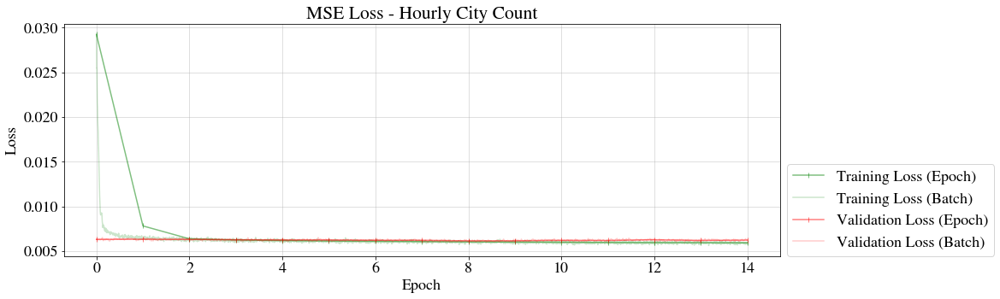

In [69]:
conf.resume = False
conf.checkpoint = "latest" #"latest" # ["best_val", "best_trn", "best_trn_val"]
conf.early_stopping = True
conf.patience = 5
conf.min_epochs = 1
conf.max_epochs = 400

trn_epoch_losses, val_epoch_losses, stopped_early = train_model(
    model=model,
    optimiser=optimiser,
    loaders=loaders,
    train_epoch_fn=train_epoch_for_sequence_model,
    loss_fn=criterion,
    conf=conf,
)

In [70]:
logging.info(f"best validation: {np.min(val_epoch_losses):.6f} @ epoch: {np.argmin(val_epoch_losses) + 1}")

2020-11-27T12:27:46 | root | INFO | best validation: 0.006173 @ epoch: 8


In [71]:
from utils.interactive import plot_interactive_epoch_losses
plot_interactive_epoch_losses(trn_epoch_losses, val_epoch_losses)

In [72]:
from trainers.generic_trainer import train_model_final

conf.max_epochs = np.argmin(val_epoch_losses) + 1 # because of index starting at zero

model = GRUFNN(
    input_size=input_size,
    hidden_size0=hidden_size, 
    hidden_size1=hidden_size//2, 
    output_size=output_size,
    num_layers=num_layers,
).to(conf.device)

optimiser = torch.optim.Adam(params=model.parameters(),lr=conf.lr, weight_decay=conf.weight_decay)

trn_val_epoch_losses = train_model_final(
    model=model,
    optimiser=optimiser,
    loaders=loaders,
    train_epoch_fn=train_epoch_for_sequence_model,
    loss_fn=criterion,
    conf=conf,
)

plot(trn_val_epoch_losses=trn_val_epoch_losses)

2020-11-27T12:27:46 | root | INFO | 
 ====================== Final Training Hourly City Count ====================== 

2020-11-27T12:27:46 | root | INFO | 
 ====================== Config Values ====================== 
{'batch_size': 128,
 'cap_crime_percentile': 0,
 'checkpoint': 'latest',
 'data_path': './data/processed/T1H-X2550M-Y2640M_2014-01-01_2019-01-01_#7ce/',
 'device': device(type='cuda', index=0),
 'dropout': 0,
 'early_stopping': True,
 'flatten_grid': True,
 'log_norm_scale': True,
 'lr': 0.01,
 'max_epochs': 8,
 'min_epochs': 1,
 'model_name': 'Hourly City Count',
 'model_path': './data/processed/T1H-X2550M-Y2640M_2014-01-01_2019-01-01_#7ce/models/Hourly '
               'City Count/',
 'n_channels': 3,
 'n_layers': 3,
 'n_steps_c': 3,
 'n_steps_p': 3,
 'n_steps_q': 3,
 'num_workers': 12,
 'pad_width': 0,
 'patience': 5,
 'resume': False,
 'scale_axis': 1,
 'seed': 1606470692,
 'seq_len': 168,
 'shaper_threshold': 0,
 'shaper_top_k': -1,
 'shuffle': True,
 'sub_sample_tes

#### Training Results

In [73]:
# Load latest or best validation model
# conf.checkpoint = "latest"
conf.checkpoint = "best_val"
# conf.checkpoint = "best_trn"
# conf.checkpoint = "final" # train and validation set trained model

log.info(f"Loading model from checkpoint ({conf.checkpoint}) for evaluation")

# resume from previous check point or resume from best validaton score checkpoint
# load model state
log.info(f"loading model from {conf.model_path}")
model_state_dict = torch.load(f"{conf.model_path}model_{conf.checkpoint}.pth", map_location=conf.device.type)
model.load_state_dict(model_state_dict)

2020-11-27T12:27:59 | root | INFO | Loading model from checkpoint (best_val) for evaluation
2020-11-27T12:27:59 | root | INFO | loading model from ./data/processed/T1H-X2550M-Y2640M_2014-01-01_2019-01-01_#7ce/models/Hourly City Count/


<All keys matched successfully>

In [74]:
if FREQ == '1H':
    step=24
    max_steps=14
elif FREQ == '24H':
    step=7
    max_steps=6
elif FREQ == '168H':
    step=52
    max_steps=3

In [75]:
from sklearn.metrics import mean_absolute_error
class EWM:
    def __init__(self, series=None):
        self.alpha = .9
        self.options = np.arange(0.001,0.999,0.001)
        
        if series is not None:
            self.fit(series)
            
    def __call__(self, series):
        return self.predict(series)
        
    def fit(self, series):
        losses = []
        for alpha in self.options:
            self.alpha = alpha
            pred = self.predict(series)
            loss = mean_absolute_error(series, pred)
            losses.append(loss)
            
        self.alpha = self.options[np.argmin(losses)]
#         print(f"alpha => {self.alpha}")
    
    def predict(self, series):
        series = np.pad(series, (1,0), 'edge')
        
        pred = pd.Series(series).ewm(alpha=self.alpha).mean().values[:-1]
        return pred

In [76]:
from pandas import DataFrame

def compare_time_series_metrics(y_true, y_score, t_range,
                                feature_names, step=24, max_steps=29, alpha=0.5, rangeslider_visible=True):
    kwargs = dict()

    offset = step * max_steps

    assert len(y_true.shape) == 2
    
    
    model_name_dict = {}
    feature_results = {}
    
     
    for i, feat_name in enumerate(feature_names):
        kwargs[f"{feat_name}_y_score"] = y_score[offset:, i]
        kwargs[f"{feat_name}_y_true"] = y_true[offset:, i]
        kwargs[f"{feat_name}_y_ha"] = historic_average(y_true[:, i], step=step,
                                                       max_steps=max_steps)[offset - 1:-1]    
        
        ewm = EWM(y_true[:,i])
        kwargs[f"{feat_name}_y_ewm"] = ewm(y_true[:,i])[offset:]
        
        feature_results[feat_name] = {
            "Ground Truth": y_true[offset:, i],
            "GRUFNN": y_score[offset:, i],
            f"HA({step},{max_steps})": historic_average(y_true[:, i],
                                                  step=step,max_steps=max_steps)[offset - 1:-1],
            f"EWM({ewm.alpha})": ewm(y_true[:,i])[offset:],
        }

        model_name_dict[feat_name] = {
            "y_score": "GRUFNN",
            "y_true": "Ground Truth",
            "y_ha": f"HA({step},{max_steps})",
            "y_ewm": f"EWM({ewm.alpha})",
        }
        
        
        plot_time_signals(t_range=t_range[offset:], alpha=alpha,
                          title=f'{freq_title} {feat_name.title()} Predicted Normalised City Counts',
                          yaxis_title='Normalised Counts [0,1]',
                          rangeslider_visible=rangeslider_visible,
                          **feature_results[feat_name]).show()
        

    ll = [] # {}
    for k, v in kwargs.items():
        i = k.find("_")
        feat_name = k[:i]
        model_type = k[i+1:]
        if model_type == 'y_true':
            continue
        row = {}
        crime_type_name = feat_name.title()
        model_name = model_name_dict[feat_name][model_type]
        row['Crime Type'] = crime_type_name
        row['Model'] = model_name
        row_ = forecast_metrics(y_true=kwargs[f"{feat_name}_y_true"], y_score=kwargs[k])
        row = {**row, **row_}
        
        ll.append(row)

#     plot_time_signals(t_range=t_range[offset:], alpha=alpha,
#                       title=f'{freq_title} Predicted Normalised City Counts',
#                       yaxis_title='Normalised Counts [0,1]',**kwargs).show()

    metrics = DataFrame(ll)
    metrics.sort_values(['Crime Type','MASE'],inplace=True)
    metrics.reset_index(inplace=True, drop='index')

    return metrics

In [77]:
trn_y_true, trn_y_score = evaluate_sequence_model(model, loaders.train_loader, conf)


# trn_y_score = scaler.inverse_transform(trn_y_score)
# trn_y_true = scaler.inverse_transform(trn_y_true)

trn_metrics = compare_time_series_metrics(
    y_true=trn_y_true,
    y_score=trn_y_score,
    t_range=loaders.train_loader.dataset.t_range[-len(trn_y_true):],
    feature_names=feature_names[:trn_y_true.shape[1]],
    step=step,
    max_steps=max_steps,
    rangeslider_visible=False,
)
display(trn_metrics)

print(trn_metrics.round(decimals=3).to_latex(
    index=False,
    caption=f"{freq_title} Crime Count Forecasting Metrics (Training Data)",
    label="tab:daily-crime-count-metrics",
))

,Crime Type,Model,MASE,MAE,MSE,RMSE
0,Total,GRUFNN,0.682469,0.059833,0.006000,0.077459
1,Total,"HA(24,14)",0.818423,0.071756,0.008464,0.091999
2,Total,EWM(0.732),0.959035,0.084080,0.011258,0.106102


\begin{table}
\centering
\caption{Hourly Crime Count Forecasting Metrics (Training Data)}
\label{tab:daily-crime-count-metrics}
\begin{tabular}{llrrrr}
\toprule
Crime Type &       Model &   MASE &    MAE &    MSE &   RMSE \\
\midrule
     Total &      GRUFNN &  0.682 &  0.060 &  0.006 &  0.077 \\
     Total &   HA(24,14) &  0.818 &  0.072 &  0.008 &  0.092 \\
     Total &  EWM(0.732) &  0.959 &  0.084 &  0.011 &  0.106 \\
\bottomrule
\end{tabular}
\end{table}



#### Test Results  `(best 0.700818)`

for 1 hour predictions

```
hidden_size = 20
epochs = 4
seq_len = 168
batch_size = 128
lr = 1-e2
seed = 1606470692
num_layer=1


GRUFNN(
  (gru): GRU(18, 20, batch_first=True)
  (lin1): Linear(in_features=20, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=1, bias=True)
  (activation): RReLU(lower=0.01, upper=0.1)
)

model = GRUFNN(
    input_size=input_size,
    hidden_size0=hidden_size, 
    hidden_size1=hidden_size//2, 
    output_size=1, 
    num_layers=2,
)
```

In [78]:
tst_y_true, tst_y_score = evaluate_sequence_model(model, loaders.test_loader, conf)
# tst_y_true, tst_y_score = tst_y_true[:,0], tst_y_score[:,0] 

tst_metrics = compare_time_series_metrics(
    y_true=tst_y_true, 
    y_score=tst_y_score,
    t_range=loaders.test_loader.dataset.t_range[-len(tst_y_true):],
    feature_names=feature_names[:tst_y_true.shape[1]],
    step=step,
    max_steps=max_steps,
    rangeslider_visible=False,
)

display(tst_metrics)

print(tst_metrics.round(decimals=3).to_latex(
    index=False,
    caption=f"{freq_title} Crime Count Forecasting Metrics (Test Data)",
    label="tab:daily-crime-count-metrics",
))

,Crime Type,Model,MASE,MAE,MSE,RMSE
0,Total,GRUFNN,0.703586,0.060645,0.006119,0.078223
1,Total,"HA(24,14)",0.799251,0.068891,0.007786,0.088237
2,Total,EWM(0.684),0.943469,0.081322,0.010580,0.102859


\begin{table}
\centering
\caption{Hourly Crime Count Forecasting Metrics (Test Data)}
\label{tab:daily-crime-count-metrics}
\begin{tabular}{llrrrr}
\toprule
Crime Type &       Model &   MASE &    MAE &    MSE &   RMSE \\
\midrule
     Total &      GRUFNN &  0.704 &  0.061 &  0.006 &  0.078 \\
     Total &   HA(24,14) &  0.799 &  0.069 &  0.008 &  0.088 \\
     Total &  EWM(0.684) &  0.943 &  0.081 &  0.011 &  0.103 \\
\bottomrule
\end{tabular}
\end{table}



## Residual Sequence Model